# Проект: Исследование рынка общепита Москвы. Рекомендации для открытия кофейни.

**Описание проекта:**

Инвесторы известного фонда решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Основателям фонда не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Необходимо исследовать рынок общественного и определить, осуществима ли мечта клиентов.

**Задачи проекта:**

1. Необходимо подготовить исследование рынка общепита Москвы, найти интересные особенности.

2. Ответить  на следующие вопросы:
- Сколько всего кофеен в Москве? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии ?

3. Дать рекомендации по открытию кофейни


**Содержание исследования:**

**1. Загрузка данных и изучение общей информации**

- Загрузка данных и изучение общей информации

- Вычисление общего количества заведений

**2.  Выполнение предобработки данных**

- Приведение типов данных в соответствие

- Выявление дубликатов явных и неявных

- Обработка пропусков

- Обработка выбросов

- Создание новых столбцов

**3.  Анализ данных. Исследование и выведение закономерностей среди объёктов общепита Москвы**

- Распределение заведений по категориям

- Исследование посадочных мест в заведениях по категориям

- Сетевые и несетевые заведения

- Категории сетевых заведений

- Исследование Топ - 15 сетей

- Распределение заведений по административным районам Москвы

- Рейтинги категорий общепита

- Распределение рейтингов по округам

- Все заведения общепита на карте Москвы

- Топ-15 улиц по количеству заведений

- Улицы с одним объектом общепита

- Средний чек в заведениях общепита Москвы

- Круглосуточные объекты общепита

- Взаимосвязи числовых данных

- Общий вывод по объектам общепита Москвы

**4.  Исследование: открытие кофейни**

- Количество кофеен и особенности их расположения

- Топ-15 сетевых кофеен. Расположение по округам, стоимость чашки кофе.

- Круглосуточные кофейни

- Стоимость чашки кофе

- Рейтинги кофеен

- Вывод по кофейням. Рекомендации по открытию кофейни.

## Загрузка  данных и изучение общей информации

### Загрузка данных и изучение общей информации 

In [1]:
# импортируем библиотеки
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go 
import pandas as pd
import numpy as np
import plotly.express as px
import folium
# импортируем маркер
from folium import Marker
# импортируем кластер
from folium.plugins import MarkerCluster

In [2]:
# Чтение файла с данными и сохранение в датафрейм
data = pd.read_csv('****')
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
# Выводим основную информацию о датафреме
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Вычисление общего количества заведений

In [4]:
# Расчет количества заведений по уникальным названиям
print('Количество заведений:', data['name'].nunique())

Количество заведений: 5614


**Приведем названия заведений к единому стилю, проверим, повлияет ли это на изменение количества заведений.**

**А также проверим, встречаются ли явные дубликаты заведений с одинаковыми адресами.**

In [5]:
# приводим столбец к нижнему регистру
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0


In [6]:
# Выводим явные дубликаты заведений, в соответствии с адресами
data.loc[data[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


**Выявлены 4 дубликата, исключим их из датафрейм.**

In [7]:
# Удаляем явные дубликаты заведений, в соответствии с адресами
data = data.drop_duplicates(subset=['name', 'address'])

**Проверим наличие неявных дубликатов в названиях заведений.**

In [8]:
# Выводим список уникальных названий заведений
sorted(data.loc[data['chain']==1]['name'].unique().tolist())

['1-я креветочная',
 '10 идеальных пицц',
 '18 грамм',
 '4 сезона',
 '7 сэндвичей',
 '8 вафель',
 '9 bar coffee',
 'abc coffee roasters',
 'air coffee',
 'americano black coffee & food',
 'arabix',
 'arcus bar and food',
 'asia gourmet',
 'bakery',
 'bb&burgers',
 'bfl’s',
 'bigсуши',
 'black star burger',
 'bodrero',
 'bon lavash',
 'boston seafood & bar',
 'bowl family',
 'brasserie lambic',
 'bro&n',
 'brooms',
 'burger club',
 'burger heroes',
 'bổ',
 'cafe',
 'cafe inn',
 'café de paris',
 'camera obscura',
 'camorra pizza e birra',
 'campus',
 'cassette cafe',
 'chicha san chen',
 'chicko',
 'cinnabon',
 'city life',
 'cofefest',
 'coffee and the city',
 'coffee bean',
 'coffee break',
 'coffee guru',
 'coffee in',
 'coffee like',
 'coffee moose',
 'coffee music',
 'coffee party',
 'coffee point',
 'coffee way',
 "coffeebar'17",
 'coffeebrain',
 "coffeekaldi's",
 'coffeeshop company',
 'coffeeshots',
 'coffeesphere',
 'coffprice',
 'cofix',
 'conversation',
 'cosmic latte',
 'cro

In [9]:
# Приведем к единым названиям неявные дубликаты наименований заведений
data['name'] = data['name'].replace("jeffrey's coffee", "jeffrey's coffeeshop")
data['name'] = data['name'].replace('white fox', 'white fox cafe')
data['name'] = data['name'].replace('wild bean', 'wild bean cafe')
data['name'] = data['name'].replace('хинкали - gали!', 'хинкали-gали!')
data['name'] = data['name'].replace('яндекс лавка', 'яндекс.лавка')
data['name'] = data['name'].replace('кулинарная лавка братьев караваевых', 'братья караваевы')

**Финальный подсчет уникальных названий заведений после обработки.**

In [10]:
print('Количество заведений:', data['name'].nunique())


Количество заведений: 5507


## Выполнение предобработки данных 

### Приведение типов данных в соответствие 

**- Колонка seats : числовой тип данных с плавающей точкой,  приведем к целочисленному типу данных для оптимизации памяти.**

**- Колонка chain : приведем к булевому типу данных.**

In [11]:
data['chain'] = data['chain'].astype('bool')

In [12]:
data['seats'] = data['seats'].astype('Int64')

In [13]:
#  Проверяем изменение типов данных
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   bool   
 13  seats              4792 non-null   Int64  
dtypes: Int64(1), bool(1), float64(5), object(7)
memory usage: 935.4+ KB


### Выявление дубликатов явных и неявных

In [14]:
# Выявление явных дубликатов в датафрейме
data.duplicated().sum()

0

**Явных дубликатов в датафрейм нет. Проверим наличие неявных дубликатов в категориальных столбцах.**

In [15]:
# Выводим список уникальных названий в столбце "Категория"
data['category'].unique().tolist()

['кафе',
 'ресторан',
 'кофейня',
 'пиццерия',
 'бар,паб',
 'быстрое питание',
 'булочная',
 'столовая']

In [16]:
# Выводим список уникальных названий в столбце "Район"
data['district'].unique().tolist()

['Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Западный административный округ',
 'Центральный административный округ',
 'Восточный административный округ',
 'Юго-Восточный административный округ',
 'Южный административный округ',
 'Юго-Западный административный округ']

**Дубликатов нет.**

### Работа с пропусками

In [17]:
# Вычисление кол-ва пропусков в каждом столбце
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

**Колонки с пропущенными данными:**

- hours : Для анализа важно круглосуточно ли работает заведение, вручную данные заполнить не представяется возможным, оставляем как есть.

- price : Большое количество пропусков, проанализируем, можно ли заполнить данные.

- avg_bill: Заполнить вручную данные не представяется возможным, оставляем как есть.

- middle_avg_bill: Большое количество пропусков, проанализируем, можно ли заполнить данные.

- middle_coffee_cup: Большое количество пропусков, проанализируем, можно ли заполнить данные.

- seats : Количество посадочных мест зависит от площади заведения, этих данных у нас, поэтому оставим пропуски.

**Проверим, все ли значения заполнены в колонках "middle_avg_bill" и "middle_coffee_cup", в соответствии с колонкой "avg_bill"**

In [18]:
# Выведем список уникальных значений в колонке "avg_bill" для определения типа счета.
data['avg_bill'].unique().tolist()

[nan,
 'Средний счёт:1500–1600 ₽',
 'Средний счёт:от 1000 ₽',
 'Цена чашки капучино:155–185 ₽',
 'Средний счёт:400–600 ₽',
 'Средний счёт:199 ₽',
 'Средний счёт:200–300 ₽',
 'Средний счёт:от 500 ₽',
 'Средний счёт:1000–1200 ₽',
 'Цена бокала пива:250–350 ₽',
 'Средний счёт:330 ₽',
 'Средний счёт:1500 ₽',
 'Средний счёт:300–500 ₽',
 'Средний счёт:140–350 ₽',
 'Средний счёт:350–500 ₽',
 'Средний счёт:300–1500 ₽',
 'Средний счёт:от 240 ₽',
 'Средний счёт:200–250 ₽',
 'Средний счёт:328 ₽',
 'Средний счёт:300 ₽',
 'Средний счёт:от 345 ₽',
 'Средний счёт:60–400 ₽',
 'Средний счёт:900 ₽',
 'Средний счёт:500–800 ₽',
 'Средний счёт:500–1000 ₽',
 'Средний счёт:600–700 ₽',
 'Цена бокала пива:120–350 ₽',
 'Средний счёт:1000–1500 ₽',
 'Средний счёт:1500–2000 ₽',
 'Цена чашки капучино:150–190 ₽',
 'Средний счёт:2000–2500 ₽',
 'Средний счёт:600 ₽',
 'Средний счёт:450 ₽',
 'Цена чашки капучино:120–170 ₽',
 'Средний счёт:100–500 ₽',
 'Средний счёт:от 850 ₽',
 'Цена чашки капучино:100–200 ₽',
 'Средний 

In [19]:
# Создание функции для определения типа счета.
def categorize_bill(row):
    try:
        if 'Средний счёт' in row:
            return 'Средний счёт'
        elif 'Цена чашки капучино' in row:
            return 'Цена чашки капучино'
        elif 'Цена бокала пива' in row:
            return 'Цена бокала пива'
    except:
        return 'не определено'

In [20]:
# Создадим новую колонку с типом заказа
data['category_bill'] = data['avg_bill'].apply(categorize_bill)
data['category_bill'].value_counts()

не определено          4586
Средний счёт           3149
Цена чашки капучино     535
Цена бокала пива        132
Name: category_bill, dtype: int64

**Количество данных в колонке "middle_avg_bill" должно совпадать с типом заказа "Средний счёт".**

**Количество данных в колонке "middle_coffee_cup" должно совпадать с типом заказа "Цена чашки капучино".**

In [21]:
# Выявление пересечений в колонке middle_avg_bill с типом заказа "Средний счет".
len(data.query('category_bill=="Средний счёт" and middle_avg_bill >= 0'))

3149

**Количество данных в колонке "middle_avg_bill" совпадает с типом заказа "Средний счёт".**

In [22]:
# Выявление пересечений в колонке middle_coffee_cup с типом заказа "Цена чашки капучино".
len(data.query('category_bill=="Цена чашки капучино" and middle_coffee_cup >= 0'))

535

**Количество данных в колонке "middle_coffee_cup" совпадает с типом заказа "Цена чашки капучино".**

**Проверим, возможно ли заполнить пропуски в колонке "price" в соответствии с колонками "middle_avg_bill" и "middle_coffee_cup".**

In [23]:
# Проверка пересечений, есть данные в колонке "Средний чек", но пропуски в колонке price 
len(data.query('price.isna() and middle_avg_bill > 0'))

470

In [24]:
# Проверка пересечений, есть данные в колонке "Стоимость чашки кофе", но пропуски в колонке price 
len(data.query('price.isna() and middle_coffee_cup > 0'))

257

**Определим диапазон мин и мах значений среднего чека и стоимости чашки кофе в категориях из колонки price.**

In [25]:
# Расчитываем мах и мин значения среднего чека по категориям из колонки price.
data.pivot_table(index='price',values='middle_avg_bill',aggfunc=['count','min','max'])

,count,min,max
,middle_avg_bill,middle_avg_bill,middle_avg_bill
price,,,
высокие,437,0.0,35000.0
выше среднего,481,375.0,4500.0
низкие,93,90.0,600.0
средние,1668,165.0,2150.0


**Диапазоны по категориям цен пересекаются, значит, зависимость колонки price определяется по-другому признаку. Рассмотрим, как категории цен распределяются по наименованиям заведений.**


In [26]:
# Строим сводную таблицу наименовнаие заведения, категория цен, мах и мин значение среднего чека
data_avg_bill = (data
                 .pivot_table(index=['name','price'],
                              values='middle_avg_bill',
                              aggfunc=['count','min','max']))
data_avg_bill.columns = ['count','min','max']
data_avg_bill.sort_values(by='count',ascending=False).head(20)

,,count,min,max
name,price,,,
братья караваевы,средние,24,250.0,1000.0
му-му,средние,19,360.0,850.0
теремок,средние,16,225.0,400.0
хинкальная,средние,15,300.0,1500.0
prime,средние,15,300.0,425.0
vasilchukí chaihona №1,выше среднего,15,1500.0,1500.0
кофемания,высокие,14,0.0,2500.0
мск lounge,средние,12,1100.0,1100.0
вареничная № 1,средние,12,1100.0,1100.0


**Категория цен коррелируется непосредственно с названиями сетевых и несетевых заведений. В случае пропусков внутри сети заполнение не требуется, достаточно уникального значения. Другие зависимости для заполнения пропусков в колонке "price" не найдены, оставляем данные в прежнем виде.**

### Обработка выбросов

In [27]:
# Выводим статистические данные по всем числовым столбцам
data.describe().round(2)

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,8402.00,8402.00,8402.00,3149.00,535.00,4792.00
mean,55.75,37.61,4.23,958.05,174.72,108.36
std,0.07,0.10,0.47,1009.73,88.95,122.84
min,55.57,37.36,1.00,0.00,60.00,0.00
25%,55.70,37.54,4.10,375.00,124.50,40.00
50%,55.75,37.61,4.30,750.00,169.00,75.00
75%,55.80,37.66,4.40,1250.00,225.00,140.00
max,55.93,37.87,5.00,35000.00,1568.00,1288.00


**Из таблицы видно, что в колонках "middle_avg_bill", "middle_coffee_cup", "seats" средние значения значительно выше медианных значений, и максимальные в несколько раз выше значений 3 квартиля, что свидетельствует о выбросах в данных, которые могут искажать статистику.**

**Обработаем выбросы.**

**Для начала определим количество выбросов по всем колонкам.**

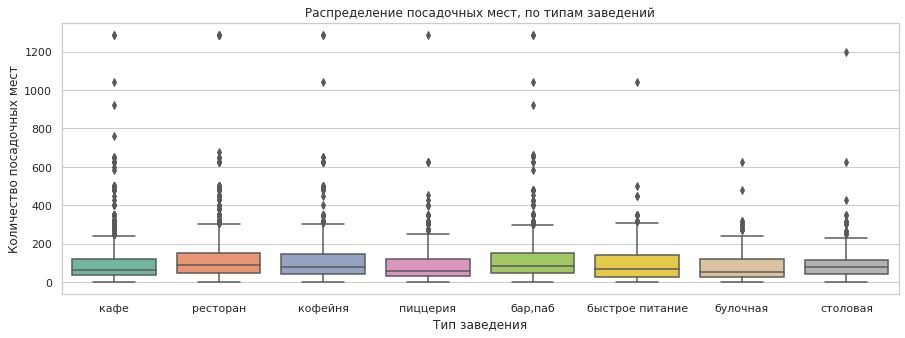

In [28]:
# Строим диаграмму размаха по колонке посадочные места.
# Задаем размеры всех графиков
sns.set(rc={'figure.figsize':(15,5)})
# Задаем тему цветовой палитры всех графиков
sns.set_palette("Set2")
# Задаем фоновый цвет всех графиков
sns.set_style('whitegrid') 
# Строим диаграмму размаха по колонке посадочные места.
sns.boxplot(x='category', y='seats', data=data)
plt.title('Распределение посадочных мест, по типам заведений')
plt.xlabel('Тип заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

**Для всех категорий заведений норма посадочных мест - до 300. Существуют и крупные заведения в небольшом количестве до 1400 посадочных мест. Но несмотря за наличи точек за пределами "усов" диаграммы , данные реальны и являются частью статистики московских заведений, поэтому их корректнее оставить в исходном виде.**

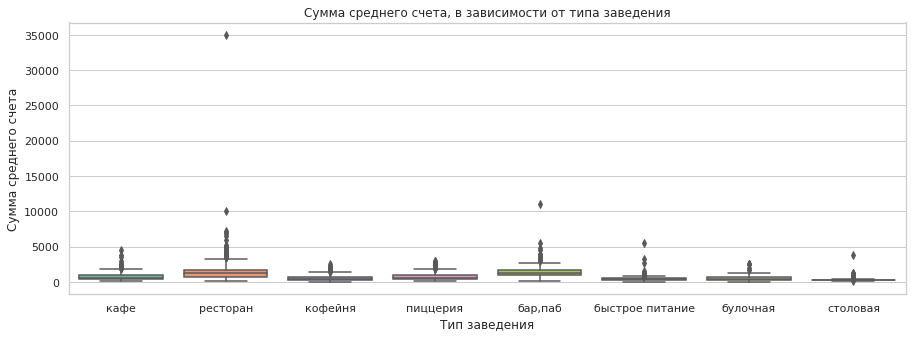

In [29]:
# Строим диаграмму размаха по колонке средний счет.
sns.boxplot(x='category', y='middle_avg_bill', data=data)
plt.title('Сумма среднего счета, в зависимости от типа заведения')
plt.xlabel('Тип заведения')
plt.ylabel('Сумма среднего счета')
plt.show()

**Отфильтруем данные по сумме счета до 6 000 руб., чтобы рассмотреть ближе распределение данных.**

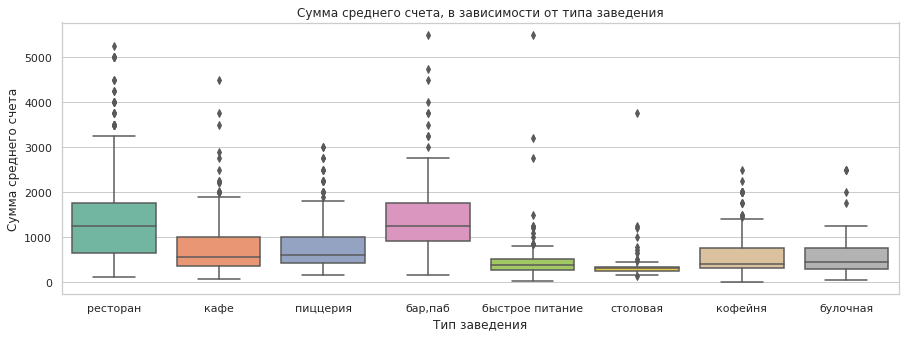

In [30]:
# Строим диаграмму размаха по колонке со средним счетом до 10 0000 руб.
sns.boxplot(x='category', y='middle_avg_bill', data=data.query('middle_avg_bill < 6000'))
plt.title('Сумма среднего счета, в зависимости от типа заведения')
plt.xlabel('Тип заведения')
plt.ylabel('Сумма среднего счета')
plt.show()

**Возьмем категорию "ресторан" с самым высоким чеком, по отношению с другими категорями, чтобы захватить максимум данных. Отфильтруем выбросы по данной категории. Норма средней суммы счета до 3500 руб. Рассчитаем сколько данных свыше 3500 руб.**

In [31]:
# Вычисление выбросов в колонке средний счет.
avg_bill_anomal = data.query('middle_avg_bill > 3500')

print('Количество выбросов в колонке "сумма среднего счета":', len(avg_bill_anomal))
print('Доля потери данных:', round((len(avg_bill_anomal))/data['middle_avg_bill'].count(),2))

Количество выбросов в колонке "сумма среднего счета": 37
Доля потери данных: 0.01


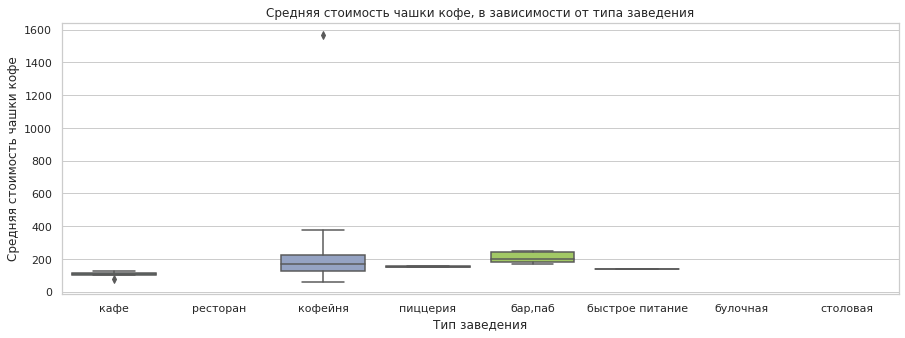

In [32]:
# Строим диаграмму размаха по колонке стоимость чашки кофе.
sns.boxplot(x='category', y='middle_coffee_cup', data=data)
plt.title('Средняя стоимость чашки кофе, в зависимости от типа заведения')
plt.xlabel('Тип заведения')
plt.ylabel('Средняя стоимость чашки кофе')
plt.show()

**На диаграмме видно точку выброса около 1600 руб., скорее всего это ошибка в данных, лишний ноль. Отфильтруем данные по стоимости чашки кофе до 400 руб., чтобы рассмотреть ближе распределение данных.**

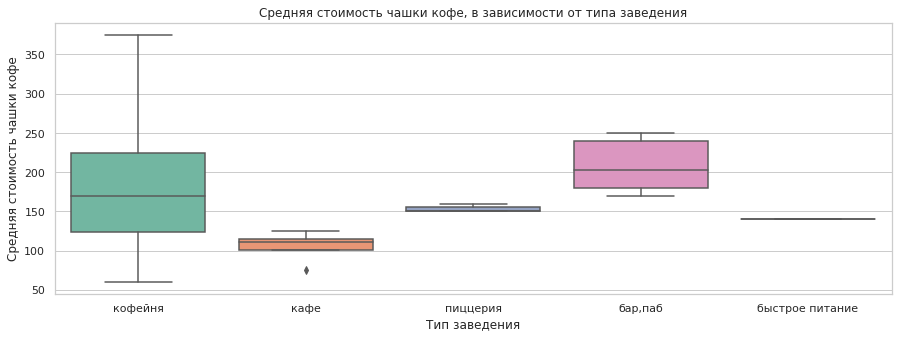

In [33]:
# Строим диаграмму размаха по колонке стоимость чашки кофе до 400 руб.
sns.boxplot(x='category', y='middle_coffee_cup', data=data.query('middle_coffee_cup < 400'))
plt.title('Средняя стоимость чашки кофе, в зависимости от типа заведения')
plt.xlabel('Тип заведения')
plt.ylabel('Средняя стоимость чашки кофе')
plt.show()

**В категории "кафе" видно точку выброса ниже 100 руб.**
 
**Рассчитаем количество выбросов свыше 400 руб. и ниже 100 руб.**

In [34]:
# Вычисление выбросов в колонке стоимость чашки кофе
coffee_cup_anomal =(data
                    .query('middle_coffee_cup > 400 or\
                    (category== "кафе" and middle_coffee_cup < 90)'))

print('Количество выбросов в колонке "Средняя стоимость чашки кофе":', len(coffee_cup_anomal))
print('Доля потери данных:', round((len(coffee_cup_anomal))/data['middle_coffee_cup'].count(),2))

Количество выбросов в колонке "Средняя стоимость чашки кофе": 2
Доля потери данных: 0.0


**В колонках "middle_avg_bill" и  "middle_coffee_cup" можно смело удалять выбросы, так как потеря данных не больше 1%.**

In [35]:
# Рассчитаем изначальное количество строк в колонках средний счет и стоимость чашки
avg_bill_long = len(data.query('middle_avg_bill>=0'))
coffee_cup_long = len(data.query('middle_coffee_cup>=0'))
print('Количество данных в колонке средний счет до обработки выбросов', avg_bill_long)
print('Количество данных в колонке стоимость чашки кофе до обработки выбросов', coffee_cup_long)

Количество данных в колонке средний счет до обработки выбросов 3149
Количество данных в колонке стоимость чашки кофе до обработки выбросов 535


In [36]:
# Удаление выбросов в колонке стоимость чашки кофе
data = (data
        .query('middle_coffee_cup.isna() or\
        ((category== "кафе" and middle_coffee_cup > 90))\
        or middle_coffee_cup < 400'))
# Удаление выбросов в колонке средний чек
data = data.query('middle_avg_bill.isna() or middle_avg_bill <= 3500')
# Рассчитаем количество строк после обработки выбросов в колонках средний счет и стоимость чашки
avg_bill_long_new = len(data.query('middle_avg_bill>=0'))
coffee_cup_long_new = len(data.query('middle_coffee_cup>=0'))
print('Количество данных в колонке средний счет', avg_bill_long_new)
print('Количество данных в колонке кофе', coffee_cup_long_new)
print('Доля потери данных в колонке средний счет:', round((1-avg_bill_long_new/avg_bill_long),2))
print('Доля потери данных в колонке кофе:', round((1-coffee_cup_long_new/coffee_cup_long),2))

Количество данных в колонке средний счет 3112
Количество данных в колонке кофе 534
Доля потери данных в колонке средний счет: 0.01
Доля потери данных в колонке кофе: 0.0


**Потеря данных не большая в колонках "middle_avg_bill" и "middle_coffee_cup", значит, выбросы обработаны верно.**

### Создание новых столбцов

In [37]:
# Создаем новую колонку с названием улицы и уберем пробелы
data['street']= data['address'].str.split(',').str[1].str.strip()

In [38]:
# Создание функции для определения круглосуточно ли работает заведение
def func (row):
    try:
        if 'круглосуточно' in row and 'ежедневно' in row:
            return 1
        else:
            return 0
    except:
        return 'False'
# Создаем новую колонку с определением круглосуточное ли заведение.
data['is_24_7'] = data['hours'].apply(func)
# Приводим новую колонку к булевому типу данных
data['is_24_7'] = data['is_24_7'].astype('bool')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,category_bill,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,<NA>,не определено,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4,Средний счёт,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45,Средний счёт,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,<NA>,Цена чашки капучино,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148,Средний счёт,правобережная улица,False


## Анализ данных 

### Распределение заведений по категориям

In [39]:
# Строим сводную таблицу с количеством заведений по категориям
data_category = data.pivot_table(index='category', values = 'address', aggfunc = 'count').reset_index()
data_category.columns=['category','address_count']
data_category = data_category.sort_values(by='address_count', ascending=False)
data_category['part'] = round(data_category['address_count']/len(data)*100,1)
print('Всего объектов обшественного питания в Москве:',data_category['address_count'].sum(), 'точек')
print('Среди них количество сетей:',\
      data.query('chain==True')['name'].nunique(),\
      'с',\
      data.query('chain==True')['address'].count(),\
      'точками' )
data_category

Всего объектов обшественного питания в Москве: 8364 точек
Среди них количество сетей: 742 с 3199 точками


,category,address_count,part
3,кафе,2374,28.4
6,ресторан,2016,24.1
4,кофейня,1412,16.9
0,"бар,паб",757,9.1
5,пиццерия,633,7.6
2,быстрое питание,602,7.2
7,столовая,314,3.8
1,булочная,256,3.1


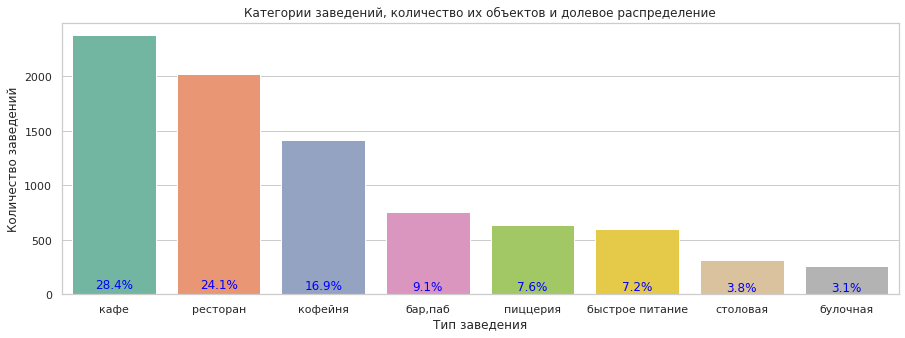

In [40]:
# Строим график распределения количества категорий заведений
sns.barplot(x='category', y='address_count', data= data_category)
plt.title('Категории заведений, количество их объектов и долевое распределение')
plt.xlabel('Тип заведения')
plt.ylabel('Количество заведений')
for index, value in enumerate(data_category['part']):
    plt.text(index, value+1, str(value)+'%', ha='center', va='bottom', color='blue')
plt.show()

**Всего в Москве 8364 точек общественого питания, 8 категорий заведений. Больше всего заведений приходится на 3 категории, по убыванию: кафе занимают 28,4 % - это 2374 точки, рестораны 24,1% - 2016 точек, кофейни занимают 16,9% - это 1412 заведения.**

### Исследование посадочных мест в заведениях по категориям

In [41]:
# Выводим статистические данные по посадочным местам, сгруппированные по категориям
seats_category = (
    data.groupby('category')['seats']
    .describe().round(2)
    .reset_index()
    .sort_values(by='50%',ascending=False)
)
seats_category

,category,count,mean,std,min,25%,50%,75%,max
6,ресторан,1251.0,121.23,124.24,0.0,48.00,85.0,150.0,1288.0
0,"бар,паб",463.0,124.80,145.73,0.0,48.00,82.0,150.0,1288.0
4,кофейня,750.0,111.28,127.90,0.0,40.00,80.0,144.0,1288.0
7,столовая,163.0,93.00,87.70,0.0,40.00,75.0,116.0,625.0
2,быстрое питание,349.0,98.89,106.61,0.0,28.00,65.0,140.0,1040.0
3,кафе,1216.0,97.42,117.96,0.0,35.75,60.0,120.0,1288.0
5,пиццерия,427.0,94.50,112.28,0.0,30.00,55.0,120.0,1288.0
1,булочная,148.0,89.39,97.69,0.0,25.00,50.0,120.0,625.0


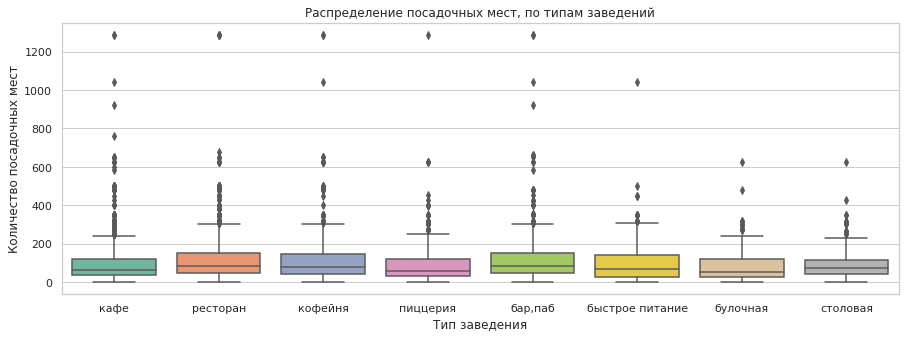

In [42]:
# Строим диаграмму размаха по посадочным местам в категориях.
sns.boxplot(x='category', y='seats', data=data)
plt.title('Распределение посадочных мест, по типам заведений')
plt.xlabel('Тип заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

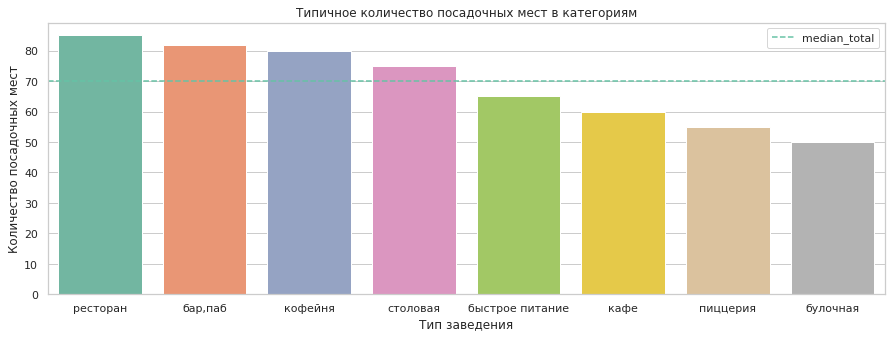

In [43]:
# Строим график распределения медианного количества посадочных мест в категориях
sns.barplot(x='category', y='50%', data= seats_category)
plt.title('Типичное количество посадочных мест в категориям')
plt.xlabel('Тип заведения')
plt.ylabel('Количество посадочных мест')
plt.axhline(y=seats_category['50%'].median(), label='median_total',linestyle='--')
plt.legend()
plt.show()

**Самое популярное количество мест по всем категориям заведений - это 70 посадочных мест. Ориентируясь на общую медианную, заведения можно разделить на 2 группы: заведения с большой площадью, у которых медианное количество мест свыше 70, и заведения с маленькой площадью, до 70 посадочных мест. К категориям с большой площадью относятся, по порядку убывания, рестораны, бары, кофейни и столовые. В ресторанах и барах  регулярно проводятся различные мероприятия, логично, что это самые крупные заведения.Вторая группа заведений: быстрое питание, кафе, пиццерии и булочные больше предназначены на быструю ротацию посетителей, заказы на вынос, поэтому данные заведения меньше по вместимости посетителей. Самые маленькие заведения встречаются в булочных и заведениях быстрого питания.**

### Сетевые и несетевые заведения

In [44]:
# Выведем количество сетевых и несетевых заведений
data_chain = data['chain'].value_counts().reset_index()
data_chain.columns=['chain','count']
data_chain['chain']=data_chain['chain'].replace(False,'Не сетевые')
data_chain['chain']=data_chain['chain'].replace(True,'Сетевые')
data_chain['part'] = round(data_chain['count']/len(data)*100,2)
data_chain

,chain,count,part
0,Не сетевые,5165,61.75
1,Сетевые,3199,38.25


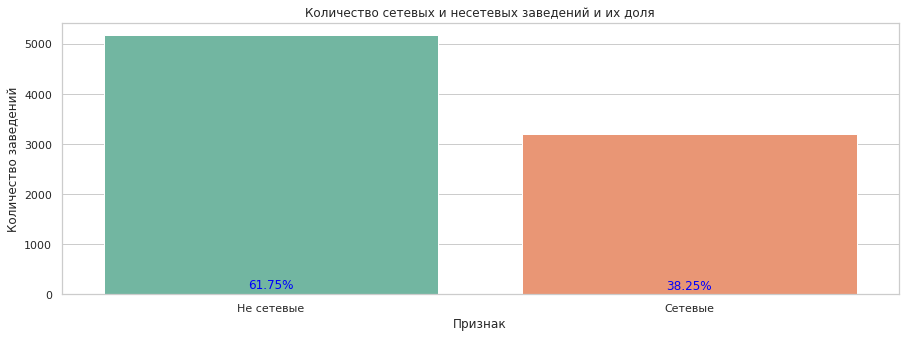

In [45]:
# Строим график распределения количества категорий заведений
sns.barplot(x='chain', y='count', data= data_chain)
plt.title('Количество сетевых и несетевых заведений и их доля')
plt.xlabel('Признак')
plt.ylabel('Количество заведений')
for index, value in enumerate(data_chain['part']):
    plt.text(index, value+1, str(value)+'%', ha='center', va='bottom', color='blue')
plt.show()

**Из общей массы заведений 61,75% являются несетевыми - это 5165 точек.
На сетевые заведения приходится 38,25%, что составляет 3199 точек.**

### Категории сетевых заведений

In [46]:
# Строим сводную таблицу по количеству сетевых заведений в каждой категории
chain_address = (data.query('chain == True')
                 .pivot_table(index='category', values='address', aggfunc = 'count'))
# Строим сводную таблицу с количеством уникальных названий сетей
chain_name = (data.query('chain == True')
              .pivot_table(index=['category','name'], values='address', aggfunc = 'count')
              .reset_index()
              .pivot_table(index='category',values='name',aggfunc = 'count'))
             
# Объединяем данные в одну таблицу
chain_category = chain_name.join(chain_address).reset_index()
chain_category.columns=['category','name_count','address_count']
# Создаем новую колонку со средним количеством точек на одну сеть
chain_category['middle_count'] = round(chain_category['address_count']/chain_category['name_count'],0)
chain_category['part_count'] = round(chain_category['address_count']/len(data.query('chain == True'))*100,2)
chain_category['part_name'] = round(chain_category['name_count']/chain_category['name_count'].sum()*100,2)
chain_category=chain_category.sort_values(by='address_count', ascending=False)
chain_category.reset_index(drop=True)

,category,name_count,address_count,middle_count,part_count,part_name
0,кафе,352,779,2.0,24.35,30.82
1,ресторан,272,727,3.0,22.73,23.82
2,кофейня,154,719,5.0,22.48,13.49
3,пиццерия,64,330,5.0,10.32,5.60
4,быстрое питание,118,231,2.0,7.22,10.33
5,"бар,паб",88,168,2.0,5.25,7.71
6,булочная,41,157,4.0,4.91,3.59
7,столовая,53,88,2.0,2.75,4.64


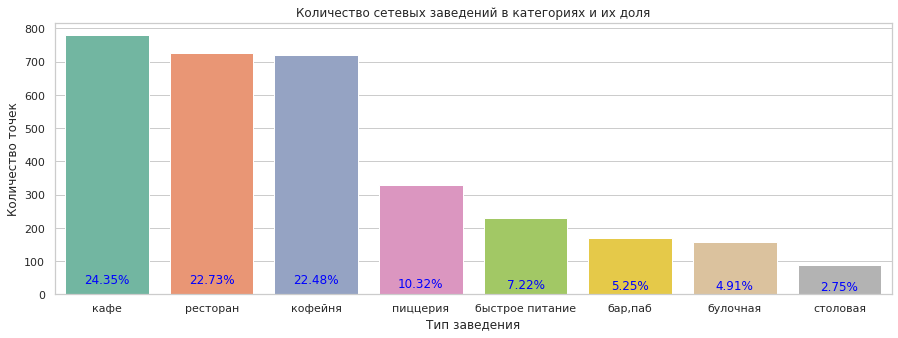

In [47]:
# Строим график распределения кол-ва сетевых заведений в категориях
sns.barplot(x='category',
            y='address_count',
            data= chain_category)
plt.title('Количество сетевых заведений в категориях и их доля')
plt.xlabel('Тип заведения')
plt.ylabel('Количество точек')
for index, value in enumerate(chain_category['part_count']):
    plt.text(index, value+1, str(value)+'%', ha='center', va='bottom', color='blue')
plt.show()

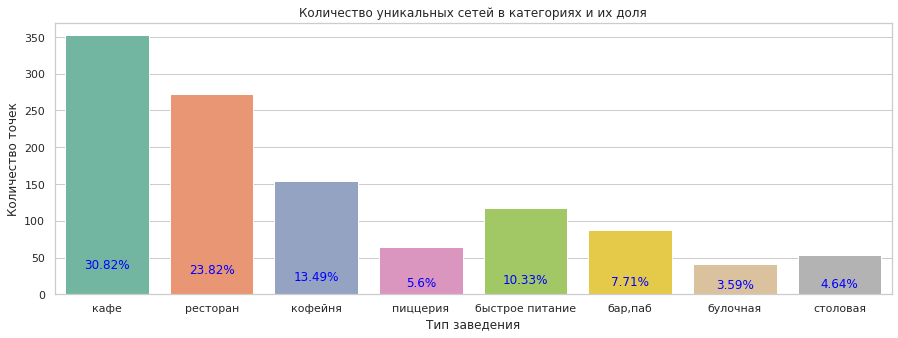

In [48]:
# Строим график распределения кол-ва уникальных сетей в категориях
sns.barplot(x='category',
            y='name_count',
            data= chain_category)
plt.title('Количество уникальных сетей в категориях и их доля')
plt.xlabel('Тип заведения')
plt.ylabel('Количество точек')
for index, value in enumerate(chain_category['part_name']):
    plt.text(index, value+1, str(value)+'%', ha='center', va='bottom', color='blue')
plt.show()


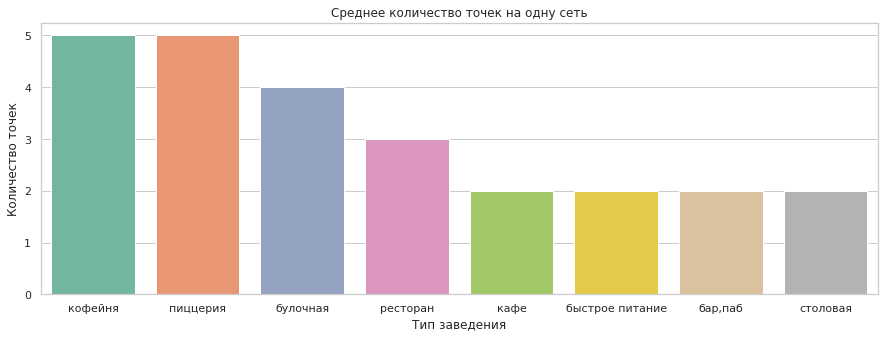

In [49]:
# Строим график распределения - среднее количество точек на одну сеть, по категориям
sns.barplot(x='category',
            y='middle_count',
            data= chain_category.sort_values(by='middle_count', ascending=False))
plt.title('Среднее количество точек на одну сеть')
plt.xlabel('Тип заведения')
plt.ylabel('Количество точек')
plt.show()

**Больше всего уникальных сетей приходится на кафе - 30,82% , рестораны - 23,82% и кофейни - 13,49% . У этих же категорий больше всего заведений, кафе заведения занимают 24,35% от всей массы точек, рестораны 22,73%, а кофейни 22,48%. Важно отметить, что у кофеен больше всего точек приходится на одну сеть, в среднем 5 заведений.Можно предположить, что кофейни самые стабильные с точки зрения развития бизнеса, так как у кофеен больше, чем у других категорий, получается расширяться. Также у пиццерий в среднем 5 заведений на одну сеть, но кол-во игроков маленькое. У пиццерий такое кол-во точек скорее связано с обустройством логистики, так как необходимо обеспечить оперативную доставку.**

### Топ - 15 сетей

In [50]:
# Строим сводную таблицу по кол-ву точек в сетях, отбираем 15 с самым большим кол-вом заведений
top_15=data.query('chain == True').pivot_table(index='name', values='address',aggfunc= ['count'])
top_15.columns = ['adress_total']
top_15 = top_15.reset_index().sort_values(by='adress_total',ascending=False).head(15)
print('Количество заведений топ-15 популярных сетей:',top_15['adress_total'].sum())
top_15

Количество заведений топ-15 популярных сетей: 818


,name,adress_total
725,шоколадница,119
333,домино'с пицца,76
329,додо пицца,74
738,яндекс.лавка,72
145,one price coffee,71
58,cofix,65
167,prime,50
660,хинкальная,44
407,кофепорт,42
254,братья караваевы,39


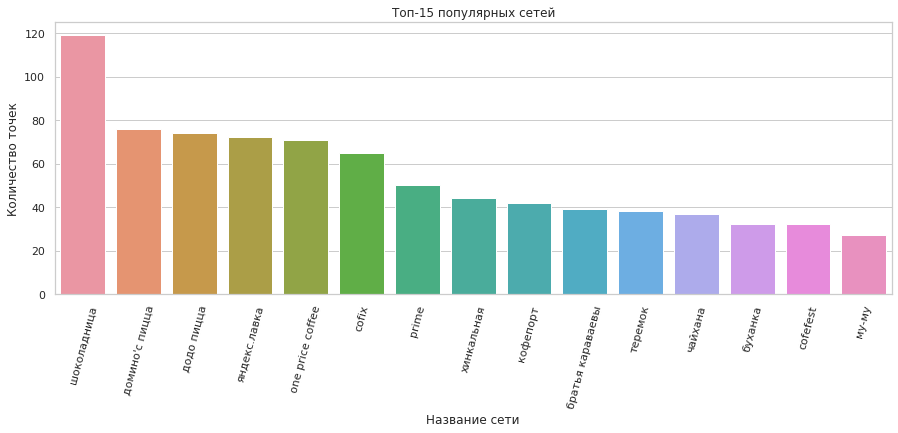

In [51]:
# Строим график топ -15 сетей
sns.barplot(x='name', y='adress_total', data= top_15)
plt.title('Топ-15 популярных сетей')
plt.xlabel('Название сети')
plt.ylabel('Количество точек')
plt.xticks(rotation=75)
plt.show()

In [52]:
# Формируем сводную таблицу с наименованием сети и уровнем цен
name_price = data.pivot_table(index=['name','price'],values='address',aggfunc = 'count')
name_price = name_price.reset_index()
# Объединяем со списком топ 15 сетей
top_15_price = top_15.merge(name_price,on='name', how='left')
top_15_price

,name,adress_total,price,address
0,шоколадница,119,выше среднего,2.0
1,шоколадница,119,низкие,1.0
2,шоколадница,119,средние,48.0
3,домино'с пицца,76,низкие,1.0
4,домино'с пицца,76,средние,39.0
5,додо пицца,74,средние,8.0
6,яндекс.лавка,72,NaN,NaN
7,one price coffee,71,средние,1.0
8,cofix,65,низкие,4.0
9,cofix,65,средние,3.0


**Из таблицы видно, что заведения внутри сети могут иметь разный статус по уровню цен, но больше всего заведений имеет статус "средний уровень цен". Это один из признаков, который объёдиняет топ-15 сетей.**

In [53]:
# Формируем сводную таблицу с категориями сетей
name_category = (data.query('chain == True')
                 .pivot_table(index=['name','category'], values='address',aggfunc= 'count')
                 .reset_index())
# Объединяем со списком топ 15 сетей
top_15_category = top_15.merge(name_category,on='name', how='left')
top_15_category

,name,adress_total,category,address
0,шоколадница,119,кафе,1
1,шоколадница,119,кофейня,118
2,домино'с пицца,76,пиццерия,76
3,додо пицца,74,пиццерия,74
4,яндекс.лавка,72,ресторан,72
5,one price coffee,71,кофейня,71
6,cofix,65,кофейня,65
7,prime,50,кафе,1
8,prime,50,ресторан,49
9,хинкальная,44,"бар,паб",3


**У заведений одной сети могут быть разные категории, так например, у известной сети "Теремок" 36 точек отосится к категории ресторан, а 2 точки к категории быстрое питание.**

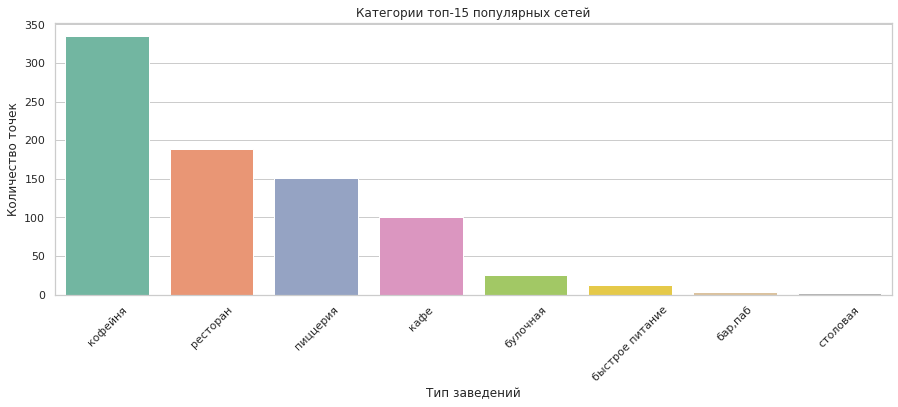

In [54]:
# Строим график распределения количества заведений по категориям из топ-15 сетей
sns.barplot(x='category', y='address',
            data = top_15_category.groupby('category')['address'].sum()
            .reset_index()
            .sort_values(by='address',ascending=False))
plt.title('Категории топ-15 популярных сетей')
plt.xlabel('Тип заведений')
plt.ylabel('Количество точек')
plt.xticks(rotation=45)
plt.show()

In [55]:
# Строим диаграмму долевого распределения категорий топ-15 сетей
fig = go.Figure(go.Pie(labels=top_15_category['category'],
                       values=top_15_category['address'],
                       hole=0.4,
                       marker=dict(colors=['#E06AA3', '#69BF7B', '#FFA812', '#9B59B6',
                                           '#5D9B9B','#3B89C7','#E74C3C','#B1E8ED'])))
fig.update_layout(
    title={'text': 'Долевое распределение категорий топ-15 сетей', 'font': {'size': 15}},
    title_x = 0.45,
    width=800, 
    height=450,
    margin=dict(b=0, l=0, r = 0, pad = 0),
    annotations=[dict(text='100%', font_size=15, showarrow=False)])
fig.show()

**Из 818 заведений топ-15 сетей, значительную долю, 41%, занимают кофейни, а именно 335 заведение. На втором месте 189 ресторанов, что составляет 23,1%. На третьем месте пиццерии 151 заведений или 18,5%.**

**Рассмотрим территориальное расположение топ - 15 сетей.**

In [56]:
# Формируем сводную таблицу с наименованиями заведений, их категориями и территориальным расположением
district_chain = (data
                  .query('chain == True')
                  .pivot_table(index=['name','category','district'],
                               values = 'address',
                               aggfunc='count'))
district_chain.columns=['address_count']
district_chain = district_chain.reset_index()

In [57]:
# Объединяем данные со списком топ-15
top_15_district = top_15.merge(district_chain,on='name', how='left')
top_15_district


,name,adress_total,category,district,address_count
0,шоколадница,119,кафе,Северный административный округ,1
1,шоколадница,119,кофейня,Восточный административный округ,11
2,шоколадница,119,кофейня,Западный административный округ,17
3,шоколадница,119,кофейня,Северный административный округ,13
4,шоколадница,119,кофейня,Северо-Восточный административный округ,11
...,...,...,...,...,...
164,му-му,27,ресторан,Западный административный округ,1
165,му-му,27,ресторан,Северо-Восточный административный округ,1
166,му-му,27,ресторан,Центральный административный округ,4
167,му-му,27,ресторан,Южный административный округ,1


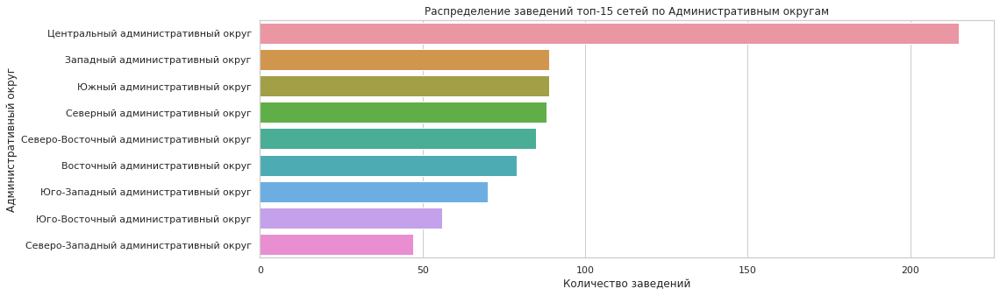

In [58]:
# Строим график распределения заведений топ-15 сетей по административным округам
sns.barplot(x='address_count',
            y='district',
            data= top_15_district
            .pivot_table(index=['district'], values='address_count', aggfunc='sum')
            .sort_values(by='address_count', ascending=False)
            .reset_index())
plt.title('Распределение заведений топ-15 сетей по Административным округам')
plt.xlabel('Количество заведений')
plt.ylabel('Административный округ')
plt.show()

**В центре Москвы больше всего сетевых заведений из топ-15, причем больше в несколько раз в сравнении с любым другим округом.**

In [59]:
# Строим сводную таблицу по кол-ву сетевых заведений по округам.
district = data.query('chain == True').pivot_table(index='district', values = 'address', aggfunc='count')
district.columns=['address_total']
district = district.reset_index()

In [60]:
# Объединим с таблицей топ-15 сетей
district_part=top_15_district.pivot_table(index=['district'], values='address_count', aggfunc='sum')
district_part.columns=['top_15_count']
district_part=district_part.reset_index()
district_part=district.merge(district_part, on='district', how = 'left')
# Определим долю сетевых заведений из топ-15 по отношению к общему кол-ву сетевых заведений,
# с разбивкой по округам
district_part['part'] = round(district_part['top_15_count']/district_part['address_total'],2)
district_part

,district,address_total,top_15_count,part
0,Восточный административный округ,281,79,0.28
1,Западный административный округ,375,89,0.24
2,Северный административный округ,346,88,0.25
3,Северо-Восточный административный округ,333,85,0.26
4,Северо-Западный административный округ,156,47,0.30
5,Центральный административный округ,874,215,0.25
6,Юго-Восточный административный округ,220,56,0.25
7,Юго-Западный административный округ,302,70,0.23
8,Южный административный округ,312,89,0.29


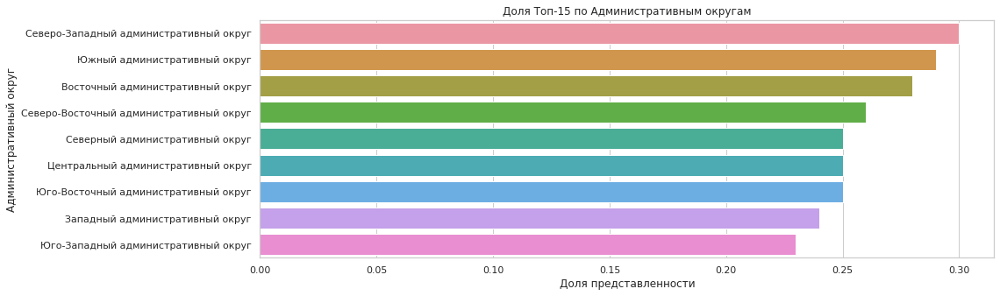

In [61]:
# График долевого распределения топ -15 заведений по окгругам 
sns.barplot(x='part', y='district', data= district_part.sort_values(by='part', ascending=False))
plt.title('Доля Топ-15 по Административным округам')
plt.xlabel('Доля представленности')
plt.ylabel('Административный округ')
plt.show()

**Однако, если рассматривать долю топ -15 в округах от общей массы сетевых заведений, то доля между округами от 23% до 30%. Это означает, что распределение заведений из топ -15 по округам равномерное в отношении общего кол-ва сетевых заведений по каждому округу.**

In [62]:
# Выводим график с количеством заведений топ-15 сетей по окгругам, в разрезе категорий
fig = px.bar(top_15_district
             .pivot_table(index=['district','category']
                          , values='address_count'
                          , aggfunc='sum')
             .reset_index(),
             x='address_count',
             y='district',
             color='category',
            )
fig.update_layout(title ={'text': 'Распределение категорий топ-15 сетей по округам', 'font': {'size': 15}},
                  title_x = 0.55,
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название района',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white"
)
fig.show()

**По графику можно отметить , что пиццерий из топ-15 в центре Москвы меньше, чем в других округах, возможно это связано с зонами доставки, выгоднее расположить пиццерию недалеко от зоны доставки, в спасльном районе.Также можно отметить, что кофеен в ЮВАО меньше, чем в других округах, возможно это зона роста для развития кофейных точек, либо в ЮВАО много несетевых кофеен, либо плотность населения ниже.**

**Рассмотрим общее распределение заведений разных категорий по окргуам.**

### Распределение заведений по административным районам Москвы

In [63]:
# Формируем сводную таблицу с количеством заведений в категориях, по округам
data_district = data['district'].value_counts().reset_index()
data_district.columns =[ 'district','total_count']
district_category = (data
                     .pivot_table(index=['district','category'], values='address', aggfunc='count')
                     .reset_index())
district_category.columns =[ 'district','category','category_count']
district_category = district_category.merge(data_district, on = 'district')
district_category['part'] = round(district_category['category_count']/district_category['total_count'],2)
district_category

,district,category,category_count,total_count,part
0,Восточный административный округ,"бар,паб",53,795,0.07
1,Восточный административный округ,булочная,25,795,0.03
2,Восточный административный округ,быстрое питание,70,795,0.09
3,Восточный административный округ,кафе,272,795,0.34
4,Восточный административный округ,кофейня,104,795,0.13
...,...,...,...,...,...
67,Южный административный округ,кафе,264,891,0.30
68,Южный административный округ,кофейня,131,891,0.15
69,Южный административный округ,пиццерия,73,891,0.08
70,Южный административный округ,ресторан,201,891,0.23


In [64]:
# Строим график распределения всех заведений Москвы по категориям в районах Москвы
fig = px.bar(district_category,
             x='category_count',
             y='district',
             color='category'
            )
fig.update_layout(title ={'text': 'Распределение заведений каждой категории в районах Москвы', 'font': {'size': 15}},
                  title_x = 0.55,
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название района',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white")
fig.show()

In [65]:
# Строим график распределения всех заведений Москвы по категориям в районах Москвы
fig = px.bar(district_category,
             x='part',
             y='district',
             color='category'
            )
fig.update_layout(title ={'text': 'Долевое распределение заведений каждой категории в районах Москвы', 'font': {'size': 15}},
                  title_x = 0.55,
                  xaxis_title = 'Доля присутствия',
                  yaxis_title = 'Название района',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white")
fig.show()

**Из графиков видно, что в абсолютных цифрах в центре Москвы больше заведений по сравнению с другими округами , как минимум в 2,5 раза. Однако , долевое распределение категорий внутри каждого округа похоже, только у центрального округа немного отличается долевое присутсвие категорий. Например, присутствие ресторанов в округах от 20% до 29%, в центре Москвы ресторанов больше всего 29%, это объяснимо тем, что основное скопление людей именно в центре, для светского время препровождения. Кафе от 26% до 39% доля присутвия в округах, однако в центре кафе всего лишь 21%, возможно это связано с высоким уровнем цен на аренду помещений в центре города.  Третий лидер среди категорий по количеству точек в городе - это кофейни, их присутвие от 12% до 22% в округах. Также можно выделить бары/пабы, в округах их присутствие от 5% до 8%, а в центральном округе 16%, ночная жизнь Москвы сконцентрирована в центре Москвы, концерты и тусовки.**

### Рейтинги категорий общепита

In [66]:
# Строим сводную таблицу со средними рейтингами категорий заведений
category_rating = (data.pivot_table(index='category', values='rating', aggfunc='mean')
                   .round(2)
                   .sort_values(by='rating', ascending=False)
                   .reset_index())
category_rating 

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.13
7,быстрое питание,4.05


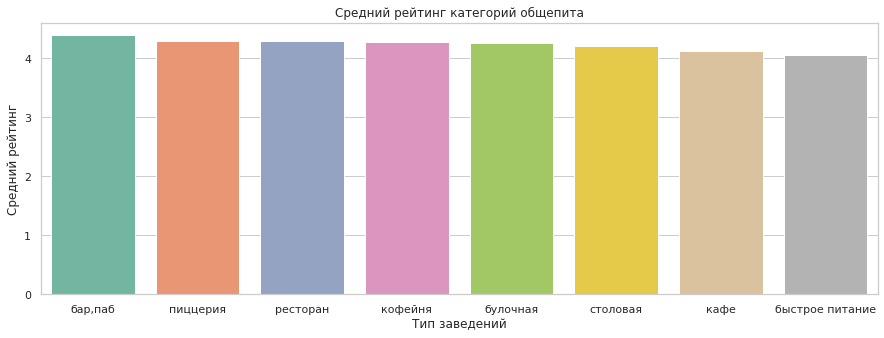

In [67]:
# Строим график средних рейтингов по категориям
sns.barplot(x='category', y='rating', data=category_rating )
plt.title('Средний рейтинг категорий общепита')
plt.xlabel('Тип заведений')
plt.ylabel('Средний рейтинг')
plt.show()

**Средний рейтинг по категориям колеблется в пределах от 4,05 до 4,39 баллов, в тройку лидеров входят :бары/пабы, пиццерии и рестораны. Самый низкий рейтинг у заведений быстрого питания, это и логично, так как это заведения с самым простым уровнем обслуживания , либо его отсутсвие, дешевая еда/фастфуд. Даже у столовых рейтинг выше, так как ассоциируется с домашней едой.**

### Распределение рейтингов по округам

In [68]:
# Строим сводную таблицу распределения среднего рейтинга по округам
district_rating = (data
                   .pivot_table(index='district', values='rating', aggfunc='mean')
                   .round(2)
                   .sort_values(by='rating')
                   .reset_index())
district_rating

,district,rating
0,Юго-Восточный административный округ,4.10
1,Северо-Восточный административный округ,4.15
2,Восточный административный округ,4.17
3,Юго-Западный административный округ,4.17
4,Западный административный округ,4.18
5,Южный административный округ,4.18
6,Северо-Западный административный округ,4.21
7,Северный административный округ,4.24
8,Центральный административный округ,4.37


In [69]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Самый высокий средний рейтинг по всем категориям заведений в центральном округе Москвы, что логично, так как заведения должны выдерживать высокий уровень обслуживания по всех критериям в виду высокой конкуренции.**

### Все заведения общепита на карте Москвы

In [70]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

In [71]:
# Строим сводную с количеством точек на улицах Москвы, выводим топ 15 улиц
top_15_street = (data['street']
                 .value_counts()
                 .reset_index()
                 .sort_values(by='street',ascending=False)
                 .head(15))
top_15_street.columns=['street','address_count']
top_15_street

,street,address_count
0,проспект мира,182
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,94
5,дмитровское шоссе,87
6,варшавское шоссе,76
7,каширское шоссе,76
8,ленинградское шоссе,69
9,мкад,65


In [72]:
# Строим сводную по улицам и категориям заведений
data_street = (data
               .pivot_table(index = ['street','category'], values='name', aggfunc='count')
              ).reset_index()
# Делаем срез по топ-15 улиц
top_15_street_category = data_street[data_street['street'].isin(top_15_street['street'])]
top_15_street_category.columns=['street','category','count'] 
top_15_street_category

,street,category,count
696,варшавское шоссе,"бар,паб",6
697,варшавское шоссе,быстрое питание,7
698,варшавское шоссе,кафе,18
699,варшавское шоссе,кофейня,14
700,варшавское шоссе,пиццерия,4
...,...,...,...
3167,улица миклухо-маклая,быстрое питание,4
3168,улица миклухо-маклая,кафе,21
3169,улица миклухо-маклая,кофейня,4
3170,улица миклухо-маклая,пиццерия,2


In [73]:
# Строим график распределения категорий топ-15 улиц
fig = px.bar(top_15_street_category,
             x='count',
             y='street',
             color='category'
            )
fig.update_layout(title ={'text': 'Распределение категорий заведений топ-15 улиц', 'font': {'size': 15}},
                  title_x = 0.5,
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название улицы',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white")
fig.show()

**Построим карту расположения заведений на топ-15 улицах**

In [74]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data[data['street'].isin(top_15_street['street'])].apply(create_clusters, axis=1)

# выводим карту
m

**В рейтинг топ-15 улиц попали самые длинные улицы Москвы, оживленные, с развитой инфраструктурой, а также улица Пятницкая в центре города. Лидер по количеству заведений улица Проспект Мира со значительным отрывом от других улиц. Распределение категорий по улицам такое же как по всей Москве, больше всего кафе, ресторанов и кофеен.**

### Улицы с одним объектом общепита

In [75]:
# Строим сводную соответствия улицы - рейтинг заведения - принадлженость к сети
street_address = (data
                  .pivot_table(index=['street','rating','chain'] ,values='address', aggfunc='count')
                  .reset_index())
# Строим сводную с количеством точек на улицах Москвы
street_one_address = data.pivot_table(index=['street'] ,values='address', aggfunc='count').reset_index()
# Фильтруем список по наличию только одного заведения
street_one_address = street_one_address.query('address==1')
# Делаем срез по одиночным улицам с рейтингом заведения и принадлежности к сети
street_one_address = street_address [street_address ['street'].isin(street_one_address['street'])]
print('Количество улиц с одним заведением:',street_one_address['address'].sum())
print('Медианный рейтинг таких заведений:',street_one_address['rating'].median())
print('Количество несетевых заведений:',len(street_one_address.query('chain==False')))
print('Количество сетевых заведений:',len(street_one_address.query('chain==True')))

Количество улиц с одним заведением: 454
Медианный рейтинг таких заведений: 4.3
Количество несетевых заведений: 320
Количество сетевых заведений: 134


In [76]:
# Строим сводную таблицу соответсвия улицы и округа и категорий
district_street = (data
                   .pivot_table(index=['street','district','category'], values='name', aggfunc='count')
                   .reset_index())
# Делаем срез из списка улиц с 1 заведением
district_street_one_address =  district_street[district_street['street'].isin(street_one_address['street'])]
# Формируем из среза сводную окуг-количество точек по категориям
district_street_one_address = (district_street_one_address
                               .pivot_table(index=['district','category'], values='name', aggfunc='sum')
                               .reset_index())
district_street_one_address

,district,category,name
0,Восточный административный округ,"бар,паб",2
1,Восточный административный округ,быстрое питание,7
2,Восточный административный округ,кафе,18
3,Восточный административный округ,кофейня,7
4,Восточный административный округ,пиццерия,6
...,...,...,...
58,Южный административный округ,быстрое питание,2
59,Южный административный округ,кафе,22
60,Южный административный округ,кофейня,5
61,Южный административный округ,ресторан,8


In [77]:
# Строим график с распределением категорий по округа из списка улиц с одним заведением
fig = px.bar(district_street_one_address ,
             x='name',
             y='district',
             color='category'
            )
fig.update_layout(title ={'text': 'Распределение категорий по округам из списка улиц с одним заведением', 'font': {'size': 15}},
                  title_x = 0.6,
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Административный округ',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white")
fig.show()

**Рассмотрим, есть ли на улицах с одним объектом общепита заведения из списка топ-15 сетей.**

In [78]:
# Строим сводную соответствия названия точки-название улицы
street_name = data.pivot_table(index=['name','street'],values='address', aggfunc='count').reset_index()
# Делаем срез из списка улиц с одной точкой
street_name = street_name[street_name['street'].isin(street_one_address['street'])]
street_name = street_name['name'].value_counts().reset_index()
street_name.columns = ['name','count']
# Делаем срез со спиской топ-15 сетей
street_name_to15 =  street_name[street_name['name'].isin(top_15['name'])]

street_name_to15

,name,count
1,яндекс.лавка,6
2,cofefest,6
5,домино'с пицца,3
13,one price coffee,2
14,чайхана,2
16,prime,2
17,братья караваевы,2
89,хинкальная,1
103,теремок,1
273,буханка,1


**Количество улиц с одним заведением: 455**

**Медианный рейтинг таких заведений: 4.3**

**Количество несетевых заведений: 321**

**Количество сетевых заведений: 134**

**Наблюдается аналогичное общему распределению улиц и категорий по округам. Больше всего кафе, ресторанов и кофеен. Больше всего таких улиц в центре Москвы. Можно отметить, что среди одиночных улиц есть заведения из списка топ-15 сетей, но таких точек очень мало. Можно сделать вывод, что такие улицы с невысоким трафиком.**

### Средний чек в заведениях общепита Москвы

In [79]:
# Вычисляем медианную сумму чека в заведениях по округам
middle_avg_bill = (data
                   .pivot_table(index='district', values = 'middle_avg_bill', aggfunc= 'median')
                   .reset_index())
middle_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,950.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [80]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Средний чек',
).add_to(m)

# выводим карту
m

**Медианная сумма чека по районам колеблется от 450 рублей до 1000 рублей. Самый дорогой район в Москве - это центр города и западный округ. Это самые престижные районы Москвы, которые сочетают в себе историческую часть города, новые престижные районы ,такие как Москва-Сити, и частные участки по направлению рублевского шоссе. Самый низкий уровнь цен в округах, характерных спальными районами и промышленными зонами, такие как ЮАО, ЮВАО и СВАО.**

### Круглосуточные объекты общепита

In [81]:
# Строим общую сводную соответсвия район - количество круглосуточных и не круглосуточных завдений по категориям
is_24_7 = data.pivot_table(index=['district','is_24_7','category'],values='name',aggfunc='count').reset_index()
is_24_7.columns = ['district','is_24_7','category','address_count']
print('Количество круглосуточных заведений в Москве:',is_24_7.query('is_24_7==True')['address_count'].sum())
is_24_7

Количество круглосуточных заведений в Москве: 1263


,district,is_24_7,category,address_count
0,Восточный административный округ,False,"бар,паб",50
1,Восточный административный округ,False,булочная,17
2,Восточный административный округ,False,быстрое питание,44
3,Восточный административный округ,False,кафе,185
4,Восточный административный округ,False,кофейня,96
...,...,...,...,...
137,Южный административный округ,True,кафе,75
138,Южный административный округ,True,кофейня,2
139,Южный административный округ,True,пиццерия,4
140,Южный административный округ,True,ресторан,19


In [82]:
# Суммируем количество объектов по районам
district_24_7 = (is_24_7
                 .pivot_table(index=['district','is_24_7'], values='address_count', aggfunc = 'sum')
                 .reset_index())

In [83]:
# Визуализируем распределение круглосуточных и не круглосуточных заведений по районам
fig = px.bar(district_24_7,
             x='address_count',
             y='district',
             color='is_24_7'
            )
fig.update_layout(title ={'text': 'Распределение круглосуточных и не круглосуточных заведений по районам', 'font': {'size': 15}},
                  title_x = 0.6,
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Административный округ',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white")
fig.show()

In [84]:
# Строим сводную таблицу распределения не/круглосуточных объектов по категориям 
group_24_7 = is_24_7.pivot_table(index=['category','is_24_7'], values='address_count', aggfunc = 'sum').reset_index()

In [85]:
# Визуализируем распределение не/круглосуточных объектов по категориям
fig = px.bar(group_24_7,
             x='address_count',
             y='category',
             color='is_24_7'
            )
fig.update_layout(title ={'text': 'Распределение круглосуточных и не круглосуточных заведений по категориям', 'font': {'size': 15}},
                  title_x = 0.5,
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Тип заведения',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white")
fig.show()

In [86]:
# Формируем таблицу с количетсвом категорий круглосуточных объектов по округам
category_24_7 = data.query('is_24_7==True').pivot_table(index=['district','category'],values='name',aggfunc='count').reset_index()
category_24_7.columns = ['district','category','address_count']

In [87]:
# Визуализируем категории круглосуточных объектов по округам
fig = px.bar(category_24_7,
             x='address_count',
             y='district',
             color='category'
            )
fig.update_layout(title ={'text': 'Категории круглосуточных объектов по округам', 'font': {'size': 15}},
                  title_x = 0.52,
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Административный округ',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white")
fig.show()

**Количество круглосуточных заведений в Москве 1263. В независимости от наполнения района заведениями,  круглосуточные распределены относительно равномерно, в основном варьируются по районам  от 125 до 172 точек. В северо-западном округе всего 83 точки, а самое большое количество в юго-восточном округе, а именно 178 точек. Хочется отметить, что лидирует не центр Москвы. Возможно это связано с тем, что Юго -восточный округ не дорогой, относительно других районов, меньше операционных расходов, поэтому проще содержать круглосуточные заведения. Больше всего круглосуточных объектов в категориях кафе, рестораны и быстрое питание. Кафе занимает 50% от общей массы круглосуточных заведений. Это может быть связано с тем, что  кафе обычно имеют более простое меню и менее формальную атмосферу, чем у ресторанов, что делает их более доступными и удобными для посетителей в течение всего дня и ночи, при этом сохраняется сервис для привлекательности посетителей, по сравнению с точками быстрого питания.** 

### Взаимосвязи числовых данных

**Рассмотрим, есть ли какая-то зависимость между числовыми столбцами.**

In [88]:
# Рассчитаем коэффициенты корреляции
data[['rating','middle_avg_bill', 'middle_coffee_cup','seats']].corr().round(2)

,rating,middle_avg_bill,middle_coffee_cup,seats
rating,1.00,0.27,0.15,0.02
middle_avg_bill,0.27,1.00,NaN,0.11
middle_coffee_cup,0.15,NaN,1.00,-0.01
seats,0.02,0.11,-0.01,1.00


**Коэффициенты корреляции стремятся к нулю, прямой взамосвзями между числовыми данными не наблюдается, например, рейтинг заведения от суммы среднего чека совсем не зависит, или сумма среднего чека от площади заведения.**

### Общий вывод

Проведя анализ заведений общественного питания Москвы выделим самые важные моменты:

**1.** Всего объектов общественного питания в Москве: 8364 точки

  Среди них количество сетей: 742 с 3199 точками, которые составляют 38,25% от всех точек.
  
  И 5165 точек несетевых заведений, доля которых 61,75%
  


**2.** Всего 8 категорий заведений: кафе, рестораны, кофейни, бары/пабы, пиццерии, быстрое питание, столовые и булочные.

Лидеры по количеству точек 3 категории:

- кафе занимают    28,4% - 2374 точки
- рестораны        24,1%   - 2016 точек
- кофейни занимают 16,9% - 1412 точки

**3.** По количеству точек, самое крупное скопление в центре Москвы, по сравнению с другими округами разница как минимум в 2,5 раза.

Но долевое распределение категорий внутри каждого округа похоже, только у центрального округа немного отличается долевое присутсвие категорий.

Внутри каждого округа по -прежнему лидеры кафе, рестораны и кофейни.

Кафе от 26% до 39% доля присутвия в округах, однако в центре кафе всего лишь 21%, возможно это связано с высоким уровнем цен на аренду помещений в центре города. 

В центре Москвы ресторанов больше всего, их 29%, это объяснимо тем, что основное скопление людей именно в центре, для светского время препровождения. В других округах присутствие ресторанов от 20% до 27%.

Третий лидер кофейни, их присутвие от 12% до 22% во всех округах.

Также можно выделить бары/пабы, в округах их присутствие от 5% до 8%, а в центральном округе 16%, так как ночная жизнь Москвы сконцентрирована в центре Москвы, посещение концертов и тусовок.

**4.** Средний рейтинг заведений колеблется в пределах от 4,05 до 4,39 баллов, разница не принципиальная, в тройку лидеров входят :бары/пабы, пиццерии и рестораны. Самый низкий рейтинг у заведений быстрого питания, это и логично, так как это заведения с самым простым уровнем обслуживания , либо его отсутсвие, дешевая еда/фастфуд. Даже у столовых рейтинг выше, так как ассоциируется с домашней едой.

Самый высокий средний рейтинг по всем категориям заведений в центральном округе Москвы, что логично, так как заведения должны выдерживать высокий уровень обслуживания по всех критериям в виду высокой конкуренции.

**5.** Типичная сумма чека в диапазоне от 450 рублей до 1000 рублей.

Самый дорогой район в Москве  западный округ - это центр города. Средняя сумма чека 1000 руб. 


Это самые престижные районы Москвы, которые сочетают в себе историческую часть города, новые престижные районы ,такие как Москва-Сити, и частные участки по направлению рублевского шоссе.

Самый низкий уровнь цен в округах, характерных спальными районами и промышленными зонами, такие как ЮАО, ЮВАО и СВАО.

**6.** Типичное заведение Москвы - это 70 посадочных мест.

Самые крупные по площади категории заведений, по убыванию площади: рестораны, бары/пабы, кофейни и столовые. В таких заведениях чаще встречаются  85 посадочных мест.  В ресторанах и барах регулярно проводятся различные мероприятия, логично, что это самые крупные заведения.

Вторая группа заведений, с меньшей площадью: быстрое питание, кафе, пиццерии и булочные больше предназначены на быструю ротацию посетителей, заказы на вынос, поэтому данные заведения меньше по вместимости посетителей. Чаще в таких местах 50-65 посадочных мест.Либо заведения предназначены только на доставку.


**7.** Больше всего уникальных сетей приходится на кафе - 30,82% , рестораны - 23,82% и кофейни - 13,49%. Однако по кол-ву точек эти категории практически равны: кафе  занимают 24,35% от всей массы точек, рестораны 22,73%, а кофейни 22,48%. 

Это связано с тем, что у кофеен больше всего точек приходится на одну сеть, в среднем 5 заведений. Можно предположить, что кофейни самые стабильные с точки зрения развития бизнеса, так как у кофеен больше, чем у других категорий, получается расширяться.

Также у пиццерий в среднем 5 заведений на одну сеть, но кол-во игроков маленькое. У пиццерий такое кол-во точек скорее связано с обустройством логистики, так как необходимо обеспечить оперативную доставку.

**8.** Можно выделить топ-15 популярных сетей, масса которых 818 точек

Это всем известные сети, такие как Шоколадница, Доминос пицца, ДоДо, агрегатор доставки Яндекс.Лавка, Prime, Cofix, Братья Караваевы, Теремок, Му-му и другие.

Самая крупная сеть Шоколадница,  у которой 119 заведений.

В основном у этих сетей статус среднего уровня цен - один из признаков, который объёдиняет топ-15 сетей.

Из 818 заведений топ-15 сетей, значительную долю, 41%, занимают кофейни, а именно 335 заведение. На втором месте 189 ресторанов, что составляет 23,1%. На третьем месте пиццерии 151 заведений или 18,5%.

По округам сетевые заведения распределяются примерно одинаково, в каждом округе от 23% до 30% сетевых точек.

В абсолютных значениях , как обычно лидирует центр Москвы. Концентрация сетевых точек в несколько раз больше по сравнению с любым другим округом.


Нужно отметить,  что пиццерий из топ-15 в центре Москвы меньше, чем в других округах, возможно это связано с зонами доставки, выгоднее расположить пиццерию недалеко от зоны доставки.


**9.** В рейтинг топ-15 улиц входят самые длинные улицы Москвы, оживленные, с развитой инфраструктурой, такие как Проспект мира, Профсоюзная, Ленинский проспект, Проспект Вернадского, Кутузовский проспект и другие,  а также улица Пятницкая в центре города.

Лидер по количеству заведений - 182 точки:  улица Проспект Мира со значительным отрывом от других улиц.

Распределение категорий по улицам такое же как по всей Москве, больше всего кафе, ресторанов и кофеен.

**10.** Также в Москве существуют улицы с 1 заведением.

Количество улиц с одним заведением: 454
Медианный рейтинг таких заведений: 4.3
Количество несетевых заведений: 320
Количество сетевых заведений: 134

Наблюдается аналогичное общему распределению категорий по округам. Больше всего кафе, ресторанов и кофеен. Больше всего таких улиц в центре Москвы. Можно отметить, что среди одиночных улиц есть заведения из списка топ-15 сетей, но таких точек очень мало. Можно сделать вывод, что такие улицы с невысоким трафиком.

**11.** Типичное заведение общественного питания Москвы имеет ограниченные часы работы.

Так как круглосуточных заведений в Москве 15%, что составляет  1263 точек.
Круглосуточные заведения распределены относительно равномерно, в основном варьируются по районам от 125 до 172 точек. В северо-западном округе всего 83 точки, а самое большое количество в юго-восточном округе, а именно 178 точек. Хочется отметить, что лидирует не центр Москвы. Возможно это связано с тем, что Юго -восточный округ не дорогой, относительно других районов, меньше операционных расходов, поэтому проще содержать круглосуточные заведения. 

Больше всего круглосуточных объектов в категориях кафе, рестораны и быстрое питание. Кафе занимает 50% от общей массы круглосуточных заведений. Это может быть связано с тем, что кафе обычно имеют более простое меню и менее формальную атмосферу, чем у ресторанов, что делает их более доступными и удобными для посетителей в течение всего дня и ночи, при этом сохраняется сервис для привлекательности посетителей, по сравнению с точками быстрого питания.

**12.** Коэффициенты корреляции среди доступных данных стремятся к нулю, прямой взамосвзями между числовыми данными не наблюдается, например, рейтинг заведения от суммы среднего чека совсем не зависит, или сумма среднего чека от площади заведения. 




## Исследование: открытие кофейни 

### Количество кофеен и особенности их расположения

In [89]:
# Строим сводную таблицу по количеству кофеен в округах города
coffee = (data.query('category=="кофейня"')
          .pivot_table(index=['district','chain'],values='name',aggfunc='count')
          .reset_index())
coffee.columns = ['district','chain','coffee_count']
print('Количество кофеен в Москве:',coffee['coffee_count'].sum(),'точки')
print('Среди них сетевые кофейни:',coffee.query('chain==True')['coffee_count'].sum(),'точек')
print('И несетевые кофейни:',coffee.query('chain==False')['coffee_count'].sum(),'точек')


Количество кофеен в Москве: 1412 точки
Среди них сетевые кофейни: 719 точек
И несетевые кофейни: 693 точек


In [90]:
# Строим график распределения кофеен по округам Москвы, с разбивкой по признаку сеть/не сеть
fig = px.bar(coffee ,
             x='coffee_count',
             y='district',
             color='chain')
            
fig.update_layout(title ={'text': 'Распределение кофеен по округам Москвы', 'font': {'size': 15}},
                  title_x = 0.52,
                  xaxis_title = 'Количество кофеен',
                  yaxis_title = 'Административный округ',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white")
fig.show()

**Построим карту расположения кофеен.**

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.query('category=="кофейня"').apply(create_clusters, axis=1)

# выводим карту
m

**Количество кофеен в Москве: 1412 точки.**

**Распределение на сетевые и несетевые делится практически 50/50, сетевых кофеен 719 точек, несетевых 693 точек. Такое же соотношение прослеживается практически по всем округам.** 

**Больше всего кофеен, 428 точки, располагается в центре Москвы. 356 кофеен  в сумме располагаются на севере и северо-востоке. Отстают южные округа по размещениям кофеен. Возможно, на севере Москвы сосредоточено больше офисов, торговых центров и других мест, где люди часто заходят на кофе, поэтому там больше кофеен. Самое маленькое количество кофеен в северо-западном округе, возможно в данном округе ниже плотность населения.**

### Топ-15 сетевых кофеен

**Найдем топ-15 сетевых кофеен.**

In [ ]:
# Строим сводную с количестовм точек сети и медианной стоимостью чашки кофе
coffee_top15 = (data.query('category=="кофейня"')
                .groupby('name').agg({'middle_coffee_cup': 'median','address': 'count'})
                .round(2)
                .reset_index()
                .sort_values(by='address', ascending=False).head(15))
coffee_top15.columns=['name','middle_coffee_cup','address_count']
coffee_top15

In [ ]:
# Строим график топ -15 сетей кофеен
sns.barplot(x='name', y='address_count', data= coffee_top15)
plt.title('Топ-15 популярных сетей кофеен')
plt.xlabel('Название сети')
plt.ylabel('Количество точек')
plt.xticks(rotation=75)
plt.show()

**Построим карту расположения точек топ-15 кофеен.**

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data[data['name'].isin(coffee_top15['name'])].apply(create_clusters, axis=1)

# выводим карту
m

**В топ-15 кофеен находятся сети известные и популярные,такие как Cofix, Кофемания, Cinnabon, Krispy kreme, во главе с сетью Шоколадница, которая является самой популярной среди всех категорий заведений Москвы. Больше всего точек располагается в центре Москвы и в северном округе.**

In [ ]:
# Построим график со стоимостью чашки кофе по топ-15 кофейным  сетям
sns.barplot(x='name', y='middle_coffee_cup', data=coffee_top15.query('middle_coffee_cup>0')
             .sort_values(by='middle_coffee_cup',ascending=False) )
plt.title('Топ - 15 кофейни')
plt.xlabel('Название сети')
plt.ylabel('Медианная стоимость чашки кофе в сети')
plt.axhline(y=coffee_top15['middle_coffee_cup'].median(), label='median_top15',linestyle='--')
plt.legend()
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Построим таблицу с медианной стоимостью чашки кофе топ-15 кофеен по округам
coffee_district = (data.query('category=="кофейня"')
                   .pivot_table(index=['name','district'], values='middle_coffee_cup', aggfunc='median')
                   .reset_index())
coffee_top15_district = coffee_district [coffee_district ['name'].isin(coffee_top15['name'])]
coffee_top15_district = coffee_top15_district.groupby('district')['middle_coffee_cup'].median().reset_index()
coffee_top15_district

**Построим хороплет на карте Москвы с медианной стоимостью чашки кофе топ-15 сетей.**

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_top15_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Медианная стоимость чашки кофе топ-15 кофеен',
).add_to(m)

# выводим карту
m

**Самый дорой кофе у сети Даблби, Шоколадница и Krispy kreme , стоимостью выше 200 руб. Судя по карте распределения стоимости по округам , данные сети в основном располагаются в юго-ападном округе и северо-восточном. Такие сети, как Кофепорт, Cofix, Cofefest располагаются на севере Москвы и юго-востоке, в таких сетях чашку кофе можно приобрести за 88-100 руб.  В центре Москвы можно найти любую точку из топ-15 кофеен.**

### Круглосуточные кофейни

In [ ]:
# Выведем названия круглосуточных кофеен
sorted(data.query('category=="кофейня" and is_24_7==True')['name'].unique().tolist())

In [ ]:
# Строим сводную таблицу с количеством круглосуточных кофеен по округам
coffee_24_7 = (data.query('category=="кофейня"')
               .pivot_table(index=['district','is_24_7'],values='name',aggfunc='count')
               .reset_index())
coffee_24_7.columns = ['district','is_24_7','coffee_count']
print('Количество круглосуточных кофеен в Москве:',\
      coffee_24_7.query('is_24_7==True')['coffee_count'].sum())



In [ ]:
# Строим график распределения круглосуточных кофеен по округам
fig = px.bar(coffee_24_7,
             x='coffee_count',
             y='district',
             color='is_24_7'
            )
fig.update_layout(title ={'text': 'Распределение круглосуточных и некруглосуточных кофеен по округам Москвы',\
                          'font': {'size': 15}},
                  title_x = 0.52,
                  xaxis_title = 'Количество кофеен',
                  yaxis_title = 'Административный округ',
                  yaxis={'categoryorder':'total ascending'},
                  template="plotly_white")
fig.show()

**Построим карту расположения круглосуточных кофеен.**

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.query('category=="кофейня" and is_24_7==True').apply(create_clusters, axis=1)

# выводим карту
m

**Количество круглосуточных кофеен в Москве: 74 точки. На окраинах Москвы расположены единичные кофейни, и с приближение к центру города количество круглосуточных кофеен становится больше, с самым большим количеством в центре города. Меньше всего на юге и юго-востоке, возможно это связано с тем, что в других округах больше ночных и других развлекательных заведений, которые работают также круглосуточно или до утра. Из графиков выше можно увидеть, что заведения категории бары/пабы отсутствуют на юге и юго-востоке.**

### Стоимость чашки кофе

In [ ]:
# формируем таблицу со средней стоимостью чашки кофе по округам
coffee_cup_mean = (data
                   .pivot_table(index='district', values='middle_coffee_cup', aggfunc='mean')
                   .round(2).sort_values(by='middle_coffee_cup')
                   .reset_index())
coffee_cup_median = (data
                     .pivot_table(index='district', values='middle_coffee_cup', aggfunc='median')
                     .round(2)
                     .sort_values(by='middle_coffee_cup')
                     .reset_index())
# Выведем среднюю и медианную стоимость чашки кофе
middle_coffee_cup = data['middle_coffee_cup'].mean()
median_coffee_cup = data['middle_coffee_cup'].median()
min_coffee_cup = data['middle_coffee_cup'].min()
max_coffee_cup = data['middle_coffee_cup'].max()
print('Средняя стоимость чашки кофе по Москве:',round(middle_coffee_cup,1))
print('Медианная стоимость чашки кофе по Москве:',median_coffee_cup)
print('Минимальная стоимость чашки кофе по Москве:',min_coffee_cup)
print('Максимальная стоимость чашки кофе по Москве:',max_coffee_cup)



**Построим хороплет на карте Москвы , со средней стоимостью чашки кофе по округам.**

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cup_mean,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Средняя стоимость чашки кофе',
).add_to(m)

# выводим карту
m

**Построим хороплет на карте Москвы , с медианной стоимостью чашки кофе по округам.**

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cup_median,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Медианная стоимость чашки кофе',
).add_to(m)

# выводим карту
m

**Средняя стоимость чашки кофе по Москве: 172.2**

**Медианная стоимость чашки кофе по Москве: 168.0**

**Самый дорогой кофе со средней стоимостью 190-200 руб. Значит, на среднюю цену влияет наличие кофеен с самой дорогой ценой  за чашку , а именно 375 руб. В ВАО и ЮВАО средняя стоимостьчашки кофе меньше всего ,  135 руб.-145 руб.**

**Рассмотрим, какая стоимость чашки кофе у кофеен с низким рейтингом и высоким рейтингом.**

In [ ]:
# Определим медианный рейтинг среди кофеен
data.query('category=="кофейня"')['rating'].describe()

**Медианный рейтинг среди кофеен составляет 4,3 балла. Разделим кофейни на 2 группы, с рейтингом ниже 4,3 балла и выше 4,3 балла.**

In [ ]:
# Формируем сводную таблицу с рейтингом выше 4,3 балла со стоимостью чашки кофе по округам
coffee_good = (data.query('category=="кофейня" and rating >=4.3')
               .groupby('district')
               .agg({'middle_coffee_cup': 'median'})
               .reset_index())
coffee_good.columns=['district', 'coffee_cup_good']
# Формируем сводную таблицу с рейтингом ниже 4,3 балла со стоимостью чашки кофе по округам
coffee_bed = (data.query('category=="кофейня" and rating < 4.3')
              .groupby('district')
              .agg({'middle_coffee_cup': 'median'})
              .reset_index())
coffee_bed.columns=['district', 'coffee_cup_bed']
# Объединяем в одну таблицу
coffee_good_bed = (coffee_good.merge(coffee_bed, on='district')
                   .sort_values(by='coffee_cup_good', ascending = False))
coffee_good_bed.set_index('district', inplace=True)
coffee_good_bed

**Рассмотрим какая медианная стоимость чашки кофе у кофеен с плохим рейтингом и хорошим рейтингом в округах Москвы.**

In [ ]:
# Построим график распределения медианной стоимости чашки кофе с хорошим и плохим рейтингом кофеен , по округам
coffee_good_bed.plot(kind='bar')
plt.title('Медианная стоимость чашки кофе в кофейнях с низким и высоким рейтингом, по округам Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Медианная стоимость чашки кофе')
plt.xticks(rotation=75)
plt.legend(labels=['Кофейни с хорошим рейтингом','Кофейни с плохим рейтингом'])
plt.show()

**Наблюдается следующая тенденция закономерность: у кофеен с хорошим рейтингом стоимость чашки кофе выше, чем у кофеен с низким рейтингом. Cкорее всего такие кофейни стараются выдерживать комплекс услуг на хорошем уровне: обслуживание, сервис, качество кофе, атмосфера и тд, где можно присесть и перекусить.**

### Рейтинги кофеен

In [ ]:
# Строим сводную таблицу со средним рейтингом кофеен в округах 
coffee_rating = (data.query('category=="кофейня"')
                 .pivot_table(index='district', values='rating', aggfunc='mean')
                 .round(2)
                 .sort_values(by='rating')
                 .reset_index())
coffee_rating

**Построим хороплет на карте Москвы , отражающий распределение средних рейтигов по округам.**

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Средний рейтинг кофеен',
).add_to(m)

# выводим карту
m

**Средний рейтинг по округам колеблется от 4,2 до 4,34 баллов, разница не значительная. Самый высокий рейтинг у кофеен в центре города и в северо-западном округе. Самый низкий рейтинг в западном округе, возможно у посетителей высокие ожидания и требования от заведений в данном районе, так как район считается премиальным.**

### Вывод и рекомендации по открытию кофейни: 

**1.**Количество кофеен в Москве: 1412 точки.

Распределение на сетевые и несетевые делится практически 50/50, сетевых кофеен 719 точек, несетевых 693 точек. Такое же соотношение прослеживается практически по всем округам.

**2.**Больше всего кофеен, 428 точки, располагается в центре Москвы, 356 кофеен в сумме располагаются на севере и северо-востоке. Отстают южные округа по размещениям кофеен. Возможно, на севере Москвы сосредоточено больше офисов, торговых центров и других мест, где люди часто заходят на кофе. Самое маленькое количество кофеен в северо-западном округе, возможно в данном округе ниже плотность населения.

**3.**В топ-15 кофеен находятся сети известные и популярные,такие как Cofix, Кофемания, Cinnabon, Krispy kreme, во главе с сетью Шоколадница, которая является самой популярной среди всех категорий заведений Москвы. Больше всего кофеен располагается в центре Москвы и в северном округе.

Самый дорой кофе у сети Даблби, Шоколадница и Krispy kreme , стоимостью выше 200 руб. Данные сети в основном располагаются в юго-западном округе и северо-восточном. Такие сети, как Кофепорт, Cofix, Cofefest располагаются на севере Москвы и юго-востоке, в таких сетях чашку кофе можно приобрести за 80-100 руб. В центре Москвы можно найти любую точку из топ-15 кофеен.

**4.**Количество круглосуточных кофеен в Москве: 74 точки. На окраинах Москвы расположены единичные кофейни, чем ближе к центру,тем больше круглосуточных кофеен. Расположение круглосуточных кофеен также зависит от расположения других круглосуточных и ночных развлекательных заведений. Так например, на юге и юго-востоке, отсутствуют бары/пабы, как следствие всего 4 круглосуточные кофейни.

**5.**Типичная стоимость чашки кофе по Москве: 172.0

Самый дорогой кофе со средней стоимостью 190-200 руб. в центре Москвы и западном округее. Значит, на среднюю цену влияет наличие кофеен вэтих округах с самой дорогой ценой  за чашку , а именно 375 руб. В ВАО и ЮВАО средняя стоимость чашки кофе меньше всего ,  135 руб.-145 руб.

**6.**Средний рейтинг по округам колеблется от 4,2 до 4,34 баллов, разница не значительная. Самый высокий рейтинг у кофеен в центре города и в северо-западном округе. Самый низкий рейтинг в западном округе, возможно у посетителей высокие ожидания и требования от заведений в данном районе, так как район считается премиальным.

Кофейни с хорошим рейтингом это места с рейтингом от 4,3 балла. У кофеен с хорошим рейтингом стоимость чашки кофе выше, чем у кофеен с низким рейтингом, ниже 4,3 балла. Cкорее всего это обусловлено тем, что кофейни с хорошим рейтингом стараются выдерживать комплекс услуг на хорошем уровне: обслуживание, сервис, качество кофе, атмосфера и тд, где можно присесть и перекусить, но при этом и операционные издержки также растут.

**РЕКОМЕНДАЦИИ ДЛЯ ОТКРЫТИЯ КОФЕЙНИ**

**1.** При выборе места расположения кофейни рекомендуется ориентироваться на округ, в котором располагается много офисов , торговых и развлекательных центров. Больше всего офисов в Москве находится в Центральном округе. Также много офисов можно найти в Северном, Северо-Восточном и Западном округах. 

**2.** Следует обратить внимание на плотность населения округа. В виду большой конкуренции и разной плотности потока людей в округах, можно рассчитать среднее количесто человек , которое приходится на 1 кофейню в округе. Для выявления потенциала территории. Например, в центральном округе в несколько раз больше кофеен, чем в других округах, но и плотность населения значительно выше.

**3.** На старте открытия кофейни не рекомендуется делать режим работы круглосуточный, опираясь на опыт рынка, можно сделать вывод, что спрос на такие кофейни не высокий.  А также требует увеличеннных издержек.

**4.** При открытии кофейни базово можно ориентироваться на самую распространенную стоимость чашки кофе по всей Москве  - это 172 рублей.
Однако, в зависимости от позиционирования кофейни, цена чашки кофе может быть скорректирована. Будет ли это формат "кофе с собой" или кофейня, где можно уютно присесть и что-то ещё перекусить.

Среди топ-15 кофеен формата " кофе с собой", такие как cofix, one price coffee, стоимость чашки кофе до 100 руб.
Среди топ-15 кофеен формата кафе, такие как шоколадница , стоимость чашки кофе до 256 руб.

**5.** Также, чтобы определиться со стоимостью чашки кофе, необходимо проанализировать платежеспособность населения в округах. Так, например, на востоке, юго-востоке и востоке самая низкая средняя цена чашки кофе, 135-145 рублей. Также в этих кругах больше кофеен   из топ-15 с ценой до 100 рублей, такие как cofix, one price coffee, кофепорт, cofefest.

А на западе и в центральной типичная стоимость чашки кофе 190-200 руб. И этим окугам больше предпочтений отдали сети из топ-15 , такие как Даблби, Шоколадница и Krispy kreme, Coffeekaldi's, со стоимость кофе от 200 рублей.



**Ссылка на презентацию:** https://practicum.yandex.ru/trainer/data-analyst-plus/lesson/355b1d02-f22b-438f-89a3-e41d265b7cbc/jupyter-homework/

<div class="alert alert-info">
    
Ссылка на презентацию: https://disk.yandex.ru/i/60sftQhG4uX62Q